<a href="https://colab.research.google.com/github/ProtossDragoon/Deep-Learning-with-Python/blob/main/Guidance_of_Braille_Blocks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Guidance of Braille Blocks

## Author

name : Janghoo Lee <br>
github : https://github.com/ProtossDragoon <br>
contact : dlwkdgn1@naver.com <br>
circle : https://github.com/sju-coml <br>
organization : https://web.deering.co/ <br>
published date : November, 2021


## Related Notebook

[Notebooks](https://github.com/ProtossDragoon/paper_implementation_and_testing_tf2/tree/main/notebooks)


# Environment

In [155]:
# 내장
import os, sys
import time
import logging

# 서드파티
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

## Google Drive / Git

In [120]:
#!rm -r /content/gdrive/
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


### PathManager

#### 주의

아래 클래스를 수정할 때에는 [다른 노트북](https://colab.research.google.com/drive/1imYelcKE1dQd7SPa82Uhdg_vW5avxxy6?usp=sharing) 에도 중복된 코드가 존재한다는 사실을 인지해 주세요.

In [121]:
class PathManager():
    #FIXME: clean code
    
    def __init__(
        self,
        gdrive_home_dir:str='/content/gdrive/MyDrive',
        workspace_dir_from_home_dir:str='ColabWorkspace',
        data_dir_from_home_dir:str='data',
        git_repo_name:str='paper_implementation_and_testing_tf2',
    ):
        self._set_dirs(
            data_dir_from_home_dir,
            workspace_dir_from_home_dir,
            git_repo_name,
            gdrive_home_dir=gdrive_home_dir,
            )
        self.gcs_mode = False
        self.gcp_initialized = False

    def _set_dirs(self,
        data_dir_from_home_dir,
        workspace_dir_from_home_dir,
        git_repo_name,
        gdrive_home_dir=None,
        gcs_home_dir=None,
    ):
        """경로 관련 모든 클래스 변수의 저장은
        여기서 이루어집니다.
        """
        if gdrive_home_dir:
            assert not gcs_home_dir
            self.gdrive_home_dir = gdrive_home_dir
            self.home_dir = self.gdrive_home_dir
        if gcs_home_dir:
            assert not gdrive_home_dir
            self.gcs_home_dir = gcs_home_dir
            self.home_dir = self.gcs_home_dir
        
        self._cache_data_dir_from_home_dir = data_dir_from_home_dir
        self._cache_workspace_dir_from_home_dir = workspace_dir_from_home_dir
        self._cache_git_repo_name = git_repo_name

        self.ws          = os.path.join(self.home_dir, workspace_dir_from_home_dir)
        self.git_repo_ws = os.path.join(self.ws, git_repo_name)
        self.data_dir    = os.path.join(self.home_dir, data_dir_from_home_dir)
        self.models_dir  = os.path.join(self.git_repo_ws, 'models')

    def init_gcs(
        self,
        gcs_bucket_name:str,
        gcp_project_name:str,
        gcp_project_id:str,
        gcp_region:str,
    ):
        """구글 클라우드 서비스 관련 정보를 저장하고, 
        권한을 인증해 앞으로 사용할 수 있도록 합니다.
        """
        self.gcp_initialized = True
        self.gcp_bucket_name = gcs_bucket_name
        self.gcp_project_name = gcp_project_name
        self.gcp_project_id = gcp_project_id
        self.gcp_region = gcp_region

        # this is always set on Colab, the value is 0 or 1 depending on GPU presence
        _is_colab_backend = 'COLAB_GPU' in os.environ
        if _is_colab_backend:
            if 'google.colab' in sys.modules:
                from google.colab import auth
                auth.authenticate_user()
                os.environ['GOOGLE_CLOUD_PROJECT'] = self.gcp_project_id      

    def set_to_gcs_mode(self,
        gcs_mode=True
    ):
        """실행 모드를 gcs mode 로 변경하고, 
        멤버 변수에 저장된 모든 경로를 변경합니다.
        """
        if not self.gcp_initialized:
            raise NotImplementedError('init_gcs() 을 먼저 실행하세요.')
        self.gcs_mode = gcs_mode
        if self.gcs_mode:
            self._set_dirs(
                self._cache_data_dir_from_home_dir,
                self._cache_workspace_dir_from_home_dir,
                self._cache_git_repo_name,
                gcs_home_dir=os.path.join('gs://', self.gcp_bucket_name)
            )
        else:
            self._set_dirs(
                self._cache_data_dir_from_home_dir,
                self._cache_workspace_dir_from_home_dir,
                self._cache_git_repo_name,
                gdrive_home_dir=self.gdrive_home_dir
            )

paths = PathManager()

## Perpare Data and Model

- 정성적(qualitative) 으로 평가할 데이터셋이 GDrie 에 저장되어 있는 상황입니다.
- 모델이 GCP 에 저장되어 있는 상황입니다.

### Data

In [122]:
TARGET_DATA_DIR_POSTFIX = 'rosbag/rosbag_image_no_pc_river_cloudy' #@param ['rosbag/rosbag_image_no_pc_crosswalk_return_cloudy', 'rosbag/rosbag_image_no_pc_river_cloudy']
TARGET_DATA_DIR = os.path.join(paths.data_dir, TARGET_DATA_DIR_POSTFIX)

/content/gdrive/MyDrive/data/rosbag/rosbag_image_no_pc_river_cloudy


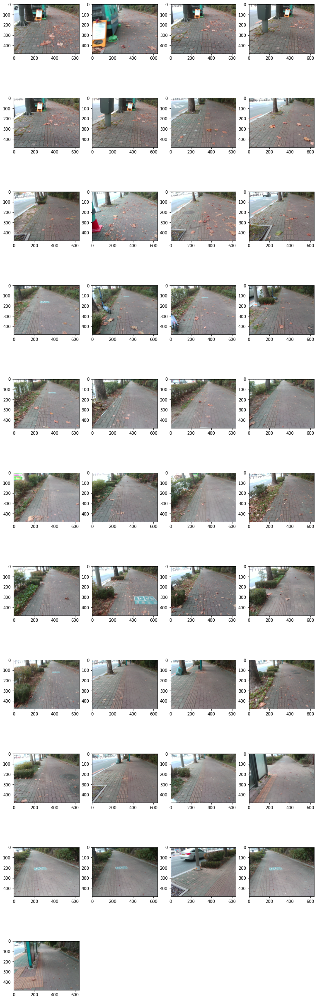

In [123]:
%cd {TARGET_DATA_DIR}
CONVERT_COLOR_FORMAT = False #@param {type:"boolean"}

im_li = []
for name in os.listdir(TARGET_DATA_DIR):
    im = cv2.imread(name)
    if CONVERT_COLOR_FORMAT:
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im_li.append(im)

def vis_all(im_li):
    plt.figure(figsize=[13, 4+len(im_li)])
    for idx, im in enumerate(im_li, 1):
        plt.subplot(len(im_li)//4+1, 4, idx)
        plt.imshow(im)

vis_all(im_li)

### Model

In [124]:
USE_GCS = True #@param {type:"boolean"}
if USE_GCS:
    GCP_BUCKET_NAME = "deer-newdolph" #@param {type:"string"}
    GCP_PROJECT_NAME = "newdolph" #@param {type:"string"}
    GCP_PROJECT_ID = "flowing-digit-326103" #@param {type:"string"}
    GCP_REGION = 'us-central1'
    paths.init_gcs(
        GCP_BUCKET_NAME,
        GCP_PROJECT_NAME,
        GCP_PROJECT_ID,
        GCP_REGION,
    )
    paths.set_to_gcs_mode(True)

MODEL_PATH_POSTFIX = 'PEDESTRIAN/SURFACE_MASKING/UNET_MOBILENETV2/b128_9c_224_224_tpu_tfrecord_gcs' #@param {type:"string"}
MODEL_PATH = os.path.join(paths.models_dir, MODEL_PATH_POSTFIX)

print(f'savedmodel {MODEL_PATH} was selected')
model = tf.keras.models.load_model(MODEL_PATH, compile=False)

savedmodel gs://deer-newdolph/ColabWorkspace/paper_implementation_and_testing_tf2/models/PEDESTRIAN/SURFACE_MASKING/UNET_MOBILENETV2/b128_9c_224_224_tpu_tfrecord_gcs was selected


## Evaluate

다양한 해상도로 평가해 봅니다.

In [125]:
def mask_to_rgb(mask, interested_classid_to_rgb=None):
    if len(mask.shape) == 2: # [h, w]
        # grayscale input
        return mask
    elif len(mask.shape) == 3: # [h, w, c]
        # normal input
        pass
    else:
        # abnormal input
        raise NotImplementedError

    n_ch = mask.shape[-1]
    # print('Number of channel : {}'.format(n_ch))
    if n_ch == 1:
        print('Binary segmentation mask detected.')
        return mask.squeeze()

    idx = np.argmax(mask, axis=-1).squeeze() # [h, w]
    ret = np.zeros([mask.shape[0], mask.shape[1], 3], dtype=np.uint8)
    masking = np.zeros([mask.shape[0], mask.shape[1]], dtype=np.uint8)

    if interested_classid_to_rgb is None:
        # n color generation
        import colorsys
        HSV_tuples = [(x*1.0/n_ch, 0.5, 0.5) for x in range(n_ch)]
        RGB_tuples = map(lambda x: colorsys.hsv_to_rgb(*x), HSV_tuples)
        for i, color in enumerate(RGB_tuples):
            color_masking = np.ma.masked_where(idx == i, masking).mask
            color = (np.array(color) * 255).astype(np.uint8)
            ret[color_masking] = color
    else:
        # use interested_classid_to_rgb dictionary
        for i, (_, color) in enumerate(interested_classid_to_rgb.items()):

            # select color
            np_color = np.array(color)
            if len(np_color.shape) == 2: # e.g. (x, 3)
                if np_color.shape[0] == 1:
                    # single color
                    color = np_color[0]
                else:
                    # multiple color
                    color = np_color[0]
            else: # e.g. (3,)
                # single color
                color = np_color

            color_masking = np.ma.masked_where(idx == i, masking).mask
            ret[color_masking] = color

    assert ret.shape[-1] == 3
    return ret

In [126]:
def simple_norm(im):
    im = im.astype(np.float32)
    im /= 125.
    im -= 1.
    return im

def inference(
    model,
    im_li:list,
    inf_w:int=None, 
    inf_h:int=None
)->list:

    res_li = []
    time_elapse_li = []
    for it, im in enumerate(im_li, 1):

        if inf_w is None:
            inf_w = im.shape[1]
        if inf_h is None:
            inf_h = im.shape[0]

        s = time.time()
        im = cv2.resize(im, (inf_w, inf_h))
        im = simple_norm(im)
        res = model(np.expand_dims(im, axis=0))
        res = np.squeeze(res)
        res_li.append(mask_to_rgb(res))
        e = time.time()
        
        time_elapse_li.append(e-s)

    if it > 2:
        t = (sum(time_elapse_li)-max(time_elapse_li))/(it-1)
    else:
        t = sum(time_elapse_li)/it

    print(f'iteration {it}, average inference time '
          f'on h, w:{(inf_h, inf_w)} shaped image consumes: {t:.2} second(s) per step')
        
    return res_li

iteration 41, average inference time on h, w:(480, 640) shaped image consumes: 0.13 second(s) per step


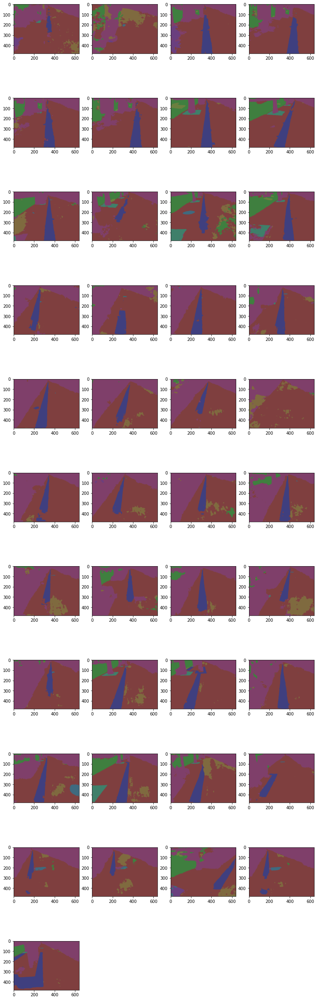

In [127]:
res_li = inference(model, im_li)
vis_all(res_li)

iteration 41, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step


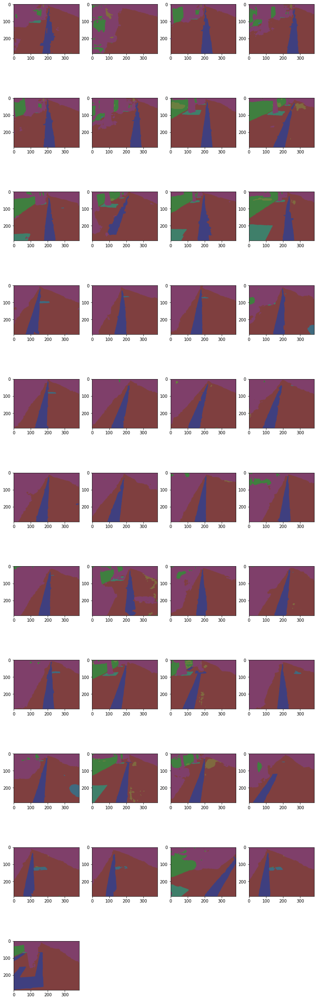

In [128]:
res_li = inference(model, im_li, 384, 288)
vis_all(res_li)

iteration 41, average inference time on h, w:(320, 320) shaped image consumes: 0.1 second(s) per step


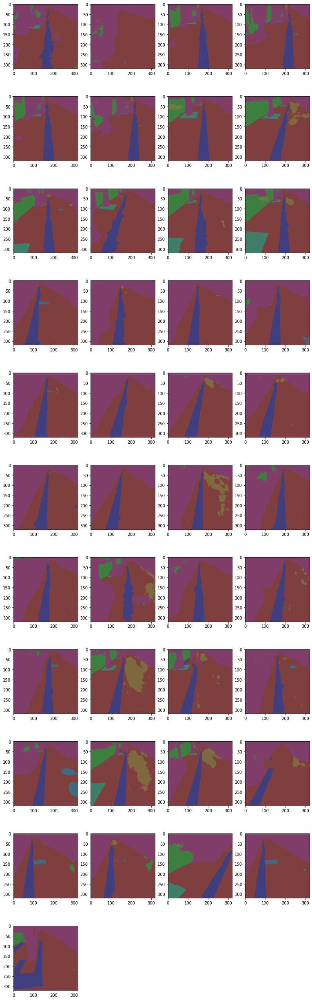

In [129]:
res_li = inference(model, im_li, 320, 320)
vis_all(res_li)

iteration 41, average inference time on h, w:(224, 224) shaped image consumes: 0.094 second(s) per step


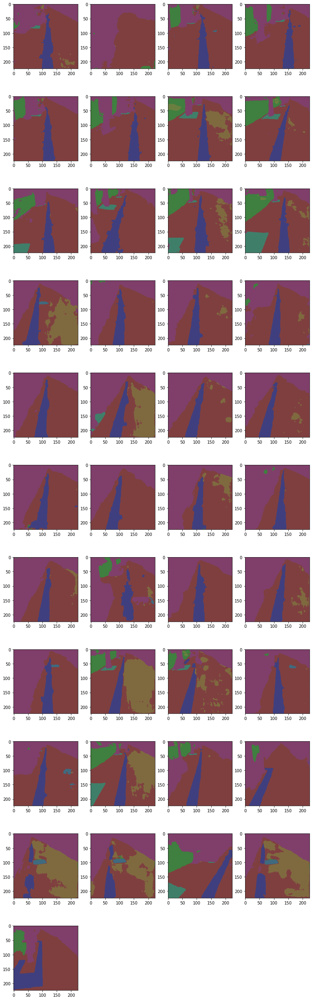

In [130]:
res_li = inference(model, im_li, 224, 224)
vis_all(res_li)

# Detect Barille Blocks

## Skeletonization

https://github.com/Image-Py/sknw

In [131]:
paths.set_to_gcs_mode(False)
%cd {paths.ws}
!git clone https://github.com/Image-Py/sknw.git
%ls -al

/content/gdrive/MyDrive/ColabWorkspace
fatal: destination path 'sknw' already exists and is not an empty directory.
total 24
drwx------ 2 root root 4096 Nov  3 09:04 albumentations/
drwx------ 2 root root 4096 Jun 22 02:12 efficientnet/
drwx------ 2 root root 4096 Jun 25 04:43 .ipynb_checkpoints/
drwx------ 2 root root 4096 May 25  2021 paper_implementation_and_testing_tf2/
drwx------ 2 root root 4096 Jun 22 02:12 segmentation_models/
drwx------ 4 root root 4096 Nov 16 09:47 sknw/


from 
[[ 63  63 127]
 [ 63 127  63]
 [ 63 127 106]
 [127  63  63]
 [127  63 106]
 [127 106  63]] unique colors,
selected (63, 63, 127) color as barille block class.

color picking algorithm fn on h, w:(224, 224) shaped image consumes 0.00221 second(s)


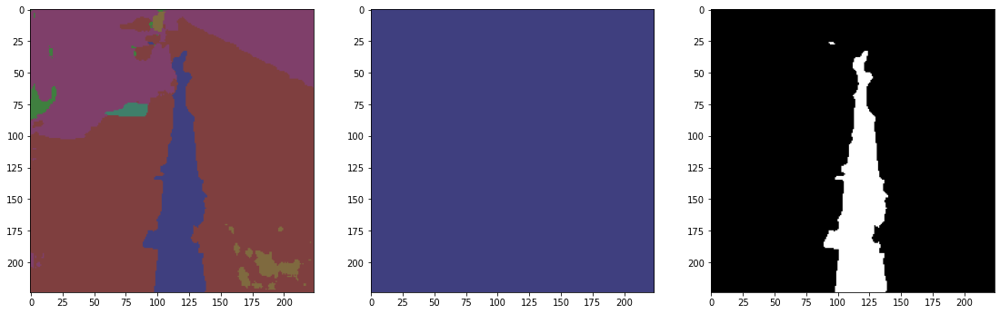

In [132]:
BARILLE_COLOR = (63, 63, 127) #@param {dtype:"list"}

im = res_li[0]
im_w = im.shape[1]
im_h = im.shape[0]
im_ch = im.shape[-1]
print(f'from \n{np.unique(im.reshape(-1, im_ch), axis=0)} unique colors,')
print(f'selected {BARILLE_COLOR} color as barille block class.\n')

# filtering
def color_picking(im):

    s = time.time()
    im_h, im_w, im_ch = im.shape
    cond = (im.reshape(-1, im_ch) == BARILLE_COLOR)
    cond = np.all(cond, axis=-1)
    cond = cond.reshape(im_h, im_w)
    binary_im = cond.astype(np.float32)
    e = time.time()    
    print(f'color picking algorithm fn '
          f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.5f} second(s)')

    return binary_im

color_vis = np.ones((im_h, im_w, im_ch),dtype=np.uint8)*BARILLE_COLOR
binary_im = color_picking(im)

# visualize
plt.figure(figsize=[19,6])

plt.subplot(1,3,1,)
plt.imshow(im)

plt.subplot(1,3,2,)
plt.imshow(color_vis)

plt.subplot(1,3,3,)
plt.imshow(binary_im, cmap='gray')

In [133]:
from skimage.util import invert
from skimage.morphology import skeletonize

zhang's method skeletonize fn on h, w:(224, 224) shaped image consumes 0.004 second(s)
lee's method skeletonize fn on h, w:(224, 224) shaped image consumes 0.007 second(s)


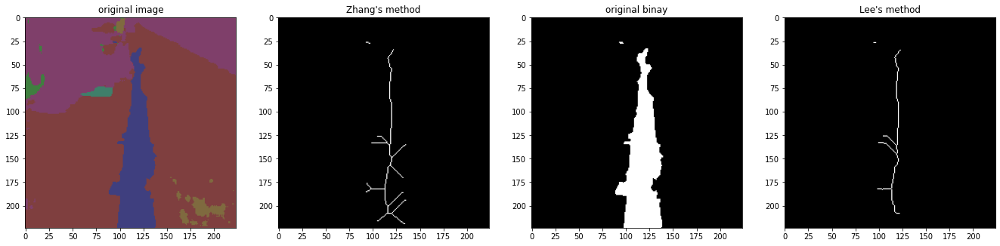

In [134]:
# perform skeletonization
def run_skeletonize(binary_im, method=None):
    im_h, im_w, = binary_im.shape
    if method is None:
        method = 'zhang'        
    s = time.time()
    skeleon_binary_im = skeletonize(binary_im, method=method)
    e = time.time()
    print(f'{method}\'s method skeletonize fn ' 
          f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.3f} second(s)')
    return skeleon_binary_im


def vis_skeletonization(
    im,
    zhang_skel,
    binary_im,
    lee_skel,
):
    ret_ax_li = []

    # visualize
    plt.figure(figsize=(23,8))
    
    ax = plt.subplot(1,4,1,)
    ax.set_title('original image')
    plt.imshow(im, cmap='gray')
    ret_ax_li.append(ax)

    ax = plt.subplot(1,4,2,)
    ax.set_title('Zhang\'s method')
    plt.imshow(zhang_skel, cmap='gray')
    ret_ax_li.append(ax)

    ax = plt.subplot(1,4,3,)
    ax.set_title('original binay')
    plt.imshow(binary_im, cmap='gray')
    ret_ax_li.append(ax)

    ax = plt.subplot(1,4,4,)
    ax.set_title('Lee\'s method')
    plt.imshow(lee_skel, cmap='gray')
    ret_ax_li.append(ax)
    
    return ret_ax_li


zhang_skel = run_skeletonize(binary_im, method='zhang')
lee_skel = run_skeletonize(binary_im, method='lee')
vis_skeletonization(
    im,
    zhang_skel,
    binary_im,
    lee_skel,
)

'ransac' line fitting method fn on h, w:(224, 224) shaped image consumes 0.015 second(s)
{'_residues': 365.82065562157794,
 'coef_': array([-0.03119637]),
 'copy_X': True,
 'fit_intercept': True,
 'intercept_': 120.69621165907671,
 'n_features_in_': 1,
 'n_jobs': None,
 'normalize': 'deprecated',
 'positive': False,
 'rank_': 1,
 'singular_': array([688.68562787])}
Parsing inliner result of line fitting on h, w:(224, 224) shaped image consumes 0.00070 second(s)


(array([ 35,  36,  37,  38,  39,  40,  41,  42,  43,  44,  45,  46,  47,
         48,  49,  50,  51,  52,  53,  54,  55,  56,  57,  58,  59,  60,
         61,  62,  63,  64,  65,  66,  67,  68,  69,  70,  71,  72,  73,
         74,  75,  76,  77,  78,  79,  80,  81,  82,  83,  84,  85,  86,
         87,  88,  89,  90,  91,  92, 118, 119, 120, 121, 122, 123, 124,
        125, 126, 127, 128, 129, 130, 131, 131, 132, 133, 133, 133, 134,
        135, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146,
        157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
        170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182,
        182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194,
        195, 196, 197, 198, 199, 200, 200, 201, 202, 203, 204, 205, 206,
        207, 208, 208, 208, 209, 210, 211, 212]),
 array([121, 121, 120, 120, 119, 118, 117, 117, 116, 117, 117, 117, 117,
        117, 118, 118, 118, 118, 119, 120, 120, 120, 120, 119, 119, 119,
 

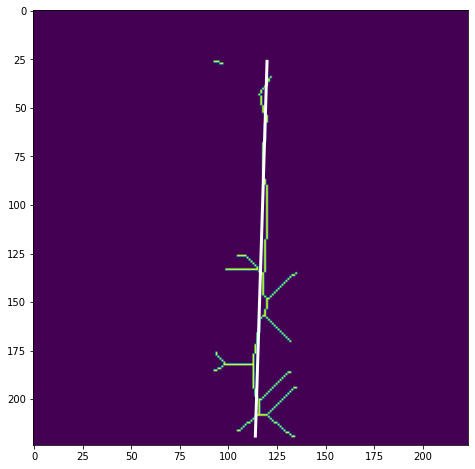

In [135]:
from sklearn import linear_model

def line_fitting(
    binary_im, 
    method='ransac'
):
    im_h, im_w, = binary_im.shape
    s = time.time()
    x, y = indices = np.nonzero(binary_im)
    inp_x = x.reshape([-1,1])
    
    if method == 'ransac':
        _model = linear_model.RANSACRegressor()
    elif method == 'linear':
        _model = linear_model.LinearRegression()
    else:
        raise NotImplementedError
    
    try:
        _model.fit(inp_x, y)
    except ValueError:
        # x, y 점이 하나도 존재하지 않음
        x = []
        y_hat = []
    else:
        y_hat = _model.predict(inp_x)
        e = time.time()
        print(f'{repr(method)} line fitting method fn ' 
            f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.3f} second(s)')

    return x, y_hat, _model


def parse_inlier(
    binary_im,
    ransac_model
):
    im_h, im_w, = binary_im.shape

    s = time.time()
    x, y = indices = np.nonzero(binary_im)
    ma = ransac_model.inlier_mask_
    x = x[ma]
    y = y[ma]
    e = time.time()

    print(f'Parsing inliner result of line fitting '
        f'on h, w:{(im_h, im_w)} shaped image consumes {e-s:.5f} second(s)')

    return x, y

x, y_hat, ransac_model = line_fitting(zhang_skel)
plt.figure(figsize=[13,8])
plt.imshow(zhang_skel)
plt.plot(
    y_hat, x,
    color='white', 
    linewidth=3,
)

import pprint
pprint.pprint(ransac_model.estimator_.__dict__)
parse_inlier(zhang_skel, ransac_model)

iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00377 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00095 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.016 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00097 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00079 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00037 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00113 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00082 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00358 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00113 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00090 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00119 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00358 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00061 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00095 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00120 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00360 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.015 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00030 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00096 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00075 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00359 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.017 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00031 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.011 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00093 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00108 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00388 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.014 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00070 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.018 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00099 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00078 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00388 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.015 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00092 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.014 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00089 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00083 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.12 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00363 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.015 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00033 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.011 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00095 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00079 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00360 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.016 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00078 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.015 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00092 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00128 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00434 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00031 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00086 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00120 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00341 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00122 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00090 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00080 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00539 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.015 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00037 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.017 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00091 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00077 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00380 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00065 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.010 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00102 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00213 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00361 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00040 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00090 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00078 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00351 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00039 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00097 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00088 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00367 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.016 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00032 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00094 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00077 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00350 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00035 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.015 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00088 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00077 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00376 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.014 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00035 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00093 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.005 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00075 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00367 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.006 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.003 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00069 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00148 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00095 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.13 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00333 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.007 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.019 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.008 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00063 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.012 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00090 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00082 second(s)
--
iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.1 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00353 second(s)
zhang's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.020 second(s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.010 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00070 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00090 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.009 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00078 second(s)
--


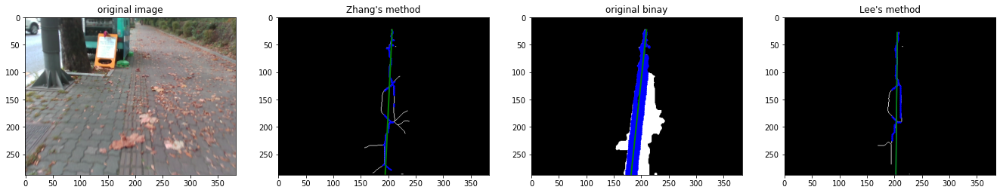

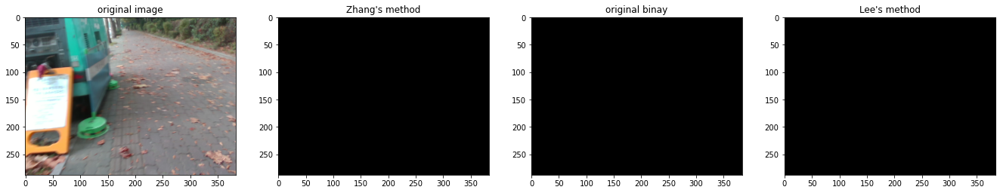

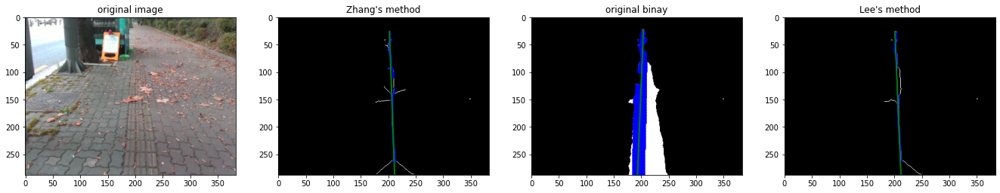

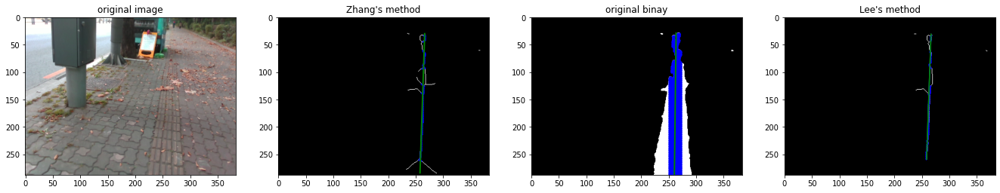

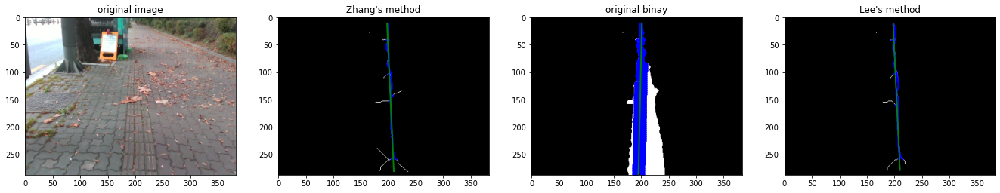

...

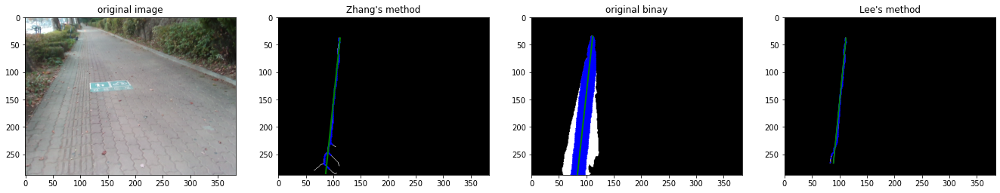

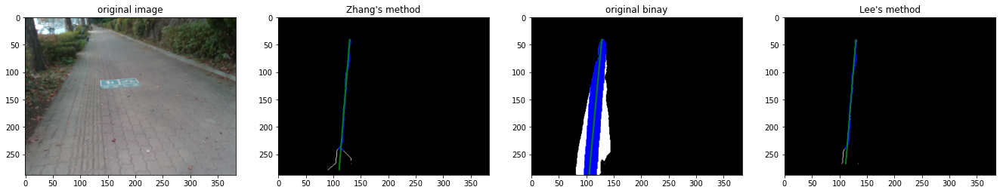

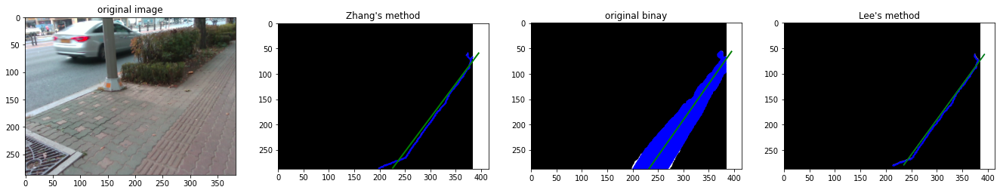

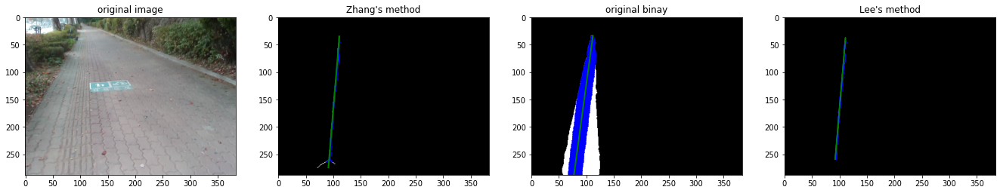

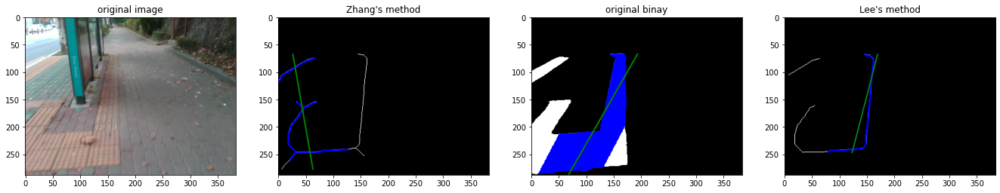

In [136]:
def result_generator(
    im_li:list,
    inf_w:int=224,
    inf_h:int=224,
):
    for idx, im in enumerate(im_li):

        im = cv2.resize(im, (inf_w, inf_h))
        res = inference(model, [im], inf_w, inf_h,)
        binary_im = color_picking(*res)

        yield (
            im,
            run_skeletonize(binary_im, method='zhang'),
            binary_im,
            run_skeletonize(binary_im, method='lee'),
        )

def vis_all_skeletonization(
    gen, *, 
    drawfig_maxn=None, 
    **kwargs
)->None:
    for idx, (original_im,
              zhang_method_im,
              original_binary_im,
              lee_mehtod_im,) in enumerate(gen, 1):
        axes = vis_skeletonization(
            original_im,
            zhang_method_im,
            original_binary_im,
            lee_mehtod_im,
            **kwargs,
        )

        # zhang_method_im
        x, y_hat, _ransac_model = line_fitting(zhang_method_im)
        axes[1].plot(
            y_hat, x,
            color='green', 
            linewidth=2)
        try:
            x, y_hat = parse_inlier(zhang_method_im, _ransac_model)
        except AttributeError:
            print('Line to fit does not exists.')
        finally:
            axes[1].scatter(
                y_hat, x, 
                s=1,
                color='blue',)

        # original_binary_im
        x, y_hat, _ransac_model = line_fitting(original_binary_im)
        axes[2].plot(
            y_hat, x,
            color='green', 
            linewidth=2)
        try:
            x, y_hat = parse_inlier(original_binary_im, _ransac_model)
        except AttributeError:
            print('Line to fit does not exists.')
        else:
            axes[2].scatter(
                y_hat, x,
                s=1,
                color='blue',)

        # lee_mehtod_im
        x, y_hat, _ransac_model = line_fitting(lee_mehtod_im)
        axes[3].plot(y_hat, x)
        axes[3].plot(
            y_hat, x,
            color='green')

        try:
            x, y_hat = parse_inlier(lee_mehtod_im, _ransac_model)
        except AttributeError:
            print('Line to fit does not exists.')
        else:
            axes[3].scatter(
                y_hat, x, 
                s=1,
                color='blue',)

        if drawfig_maxn:
            if idx >= drawfig_maxn:
                break
        print('--')

vis_all_skeletonization(result_generator(im_li, inf_w=384, inf_h=288), drawfig_maxn=0)

## Superpixel

## Vanishing Point

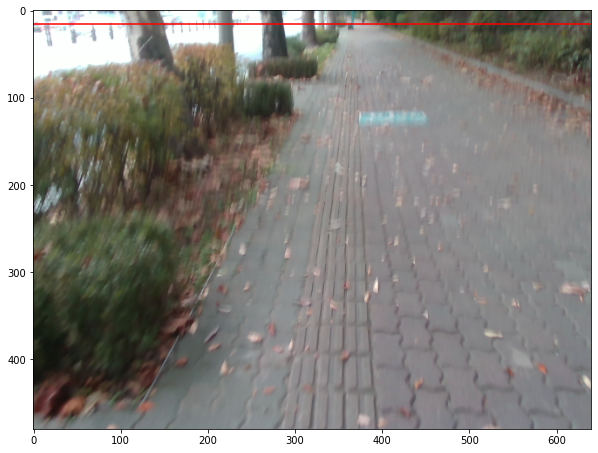

In [137]:
import random

# Just get a sample
im_sample = im_li[random.randint(0, len(im_li)-1)]
plt.figure(figsize=[10, 9])
plt.imshow(im_sample)

vanishing_line_y_intercept = 15 #@param {type:'integer'}
vanishing_line_x_coef = 0 #@param {type:"number"}

def get_fn(vanishing_line_y_intercept, vanishing_line_x_coef):
    a = vanishing_line_x_coef
    b = vanishing_line_y_intercept
    return np.vectorize(lambda x: a*x + b)

f = get_fn(vanishing_line_y_intercept, vanishing_line_x_coef)

vanishing_points_x = np.arange(im_sample.shape[1])
vanishing_points_y = f(vanishing_points_x)
plt.plot(vanishing_points_y, c='r')

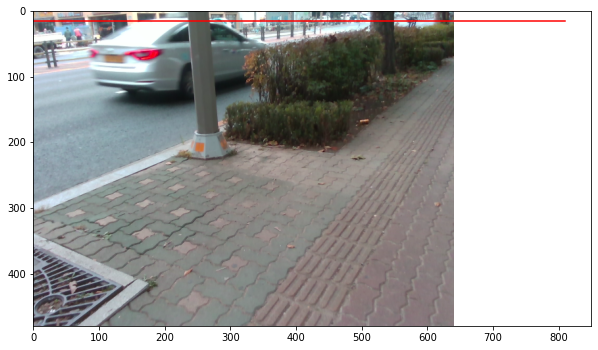

In [138]:
# Just get a great sample
im_sample = im_li[-3]
plt.figure(figsize=[10, 9])
plt.imshow(im_sample)

drawing_x_min = -10 #@param{type:"integer"}
drawing_x_max = 800#@param{type:"integer"}

f = get_fn(vanishing_line_y_intercept, vanishing_line_x_coef)
vanishing_points_x = np.arange(drawing_x_min, drawing_x_max, 1)
vanishing_points_y = f(vanishing_points_x)
plt.plot(vanishing_points_y, c='r')

iteration 1, average inference time on h, w:(288, 384) shaped image consumes: 0.11 second(s) per step
color picking algorithm fn on h, w:(288, 384) shaped image consumes 0.00347 second(s)
lee's method skeletonize fn on h, w:(288, 384) shaped image consumes 0.013 second(s)
'ransac' line fitting method fn on h, w:(288, 384) shaped image consumes 0.004 second(s)
Parsing inliner result of line fitting on h, w:(288, 384) shaped image consumes 0.00085 second(s)
About 129.0 pixel(s) distance from [192 144] to 'y=0x+15'
focal_length: 300 pixel(s)
H: [192  15] (x,y)
V(intersect): [427  15] (x,y)
Norm HV: 235.0
Camera heading pan rotation: 38.07 degree


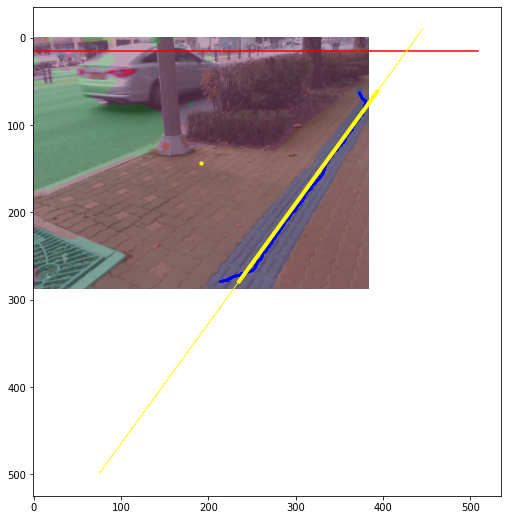

In [139]:
inf_w = 384
inf_h = 288

# pipeline
resized_im = cv2.resize(im_sample, (inf_w, inf_h))
im = inference(model, [resized_im], inf_w, inf_h,)[0]
binary_im = color_picking(im)
skeletonized_im = run_skeletonize(binary_im, method='lee')
x, y_hat, ransac_model = line_fitting(skeletonized_im)

# inference result
plt.figure(figsize=[10,9])
plt.imshow(resized_im)
plt.imshow(im, alpha=0.5)

# vanishing point result
drawing_x_min = -10 #@param{type:"integer"}
drawing_x_max = 500#@param{type:"integer"}
f = get_fn(vanishing_line_y_intercept, vanishing_line_x_coef)
vanishing_points_x = np.arange(drawing_x_min, drawing_x_max, 1)
vanishing_points_y = f(vanishing_points_x)
plt.plot(vanishing_points_y, c='red')

# line fitting result
plt.plot(
    y_hat, x,
    color='yellow', 
    linewidth=4)

# line extending result
extended_line_y = ransac_model.predict(vanishing_points_x.reshape((-1, 1)))
plt.plot(
    extended_line_y, vanishing_points_x,
    color='yellow',
    linewidth=1)

try:
    x, y_hat = parse_inlier(skeletonized_im, ransac_model)
except AttributeError:
    print('Line to fit does not exists.')
else:
    plt.scatter(
        y_hat, x, 
        s=4,
        color='blue',)
    

def get_principal_point(K=None, im_shape=None):
    """실제로 정확한 주점을 얻기 위해서는 카메라 캘리브레이션 행렬이 필요합니다.
    im_shape 은 `h,w[,ch]` 의 꼴로 주어져야 하지만
    principal point 는 `x,y` 로 리턴합니다.
    """
    if K is not None:
        assert K.shape == (3,3), '카메라 내부 행렬은 3x3 matrix 이어야 합니다.'
        assert im_shape is None, '카메라 내부 행렬을 사용해여 주점좌표를 구하는 경우 im_shape 는 입력하지 마세요.'
        p_xy = np.matmul(K, [0,0,1])[::-1]
    else:
        logging.warning('카메라 내부 행렬이 아니라 영상의 모양으로 주점을 추정한다면 정확도가 떨어질 수 있습니다.')
        assert im_shape is not None, '카메라 내부행렬이 존재하지 않는다면 영상의 shape 가 필요합니다.'
        if len(im_shape) == 2:
            wh = im_shape[::-1]
        elif len(im_shape) == 3:
            wh = im_shape[:-1][::-1]
        else:
            raise ValueError(f'im_shape 의 형태는 [h,w,c] 또는 [h,w] 형태여야 합니다. (입력된 값: {im_shape})')
        p_xy = np.array(wh[0:2]) // 2
    return p_xy


def get_focal_length(K=None):
    """애초에 이것을 얻으려는 시도를 한다는 것 자체가 정확도의 손실을 볼 수 있는 행위입니다.
    이 함수를 사용하지 않고 카메라 내부행렬을 이용하는 것이 가장 바람직합니다.
    """
    logging.warning('x, y focal length 의 평균을 통해 초점거리를 추정하면 정확도가 떨어질 수 있습니다.')
    if K is None:
        # debugging
        logging.warning('카메라 내부행렬 정보가 주어지지 않았으므로 디버깅을 위한 더미 focal length 를 리턴합니다.')
        return 300
    else:
        return (K[0,0] + K[1,1])/2.

p_xy = get_principal_point(K=None, im_shape=resized_im.shape)
plt.scatter(p_xy[0], p_xy[1], c='yellow', s=10)

# pipelnie
y_f0, y_f1 = f([0, 1]) # returns [f(0), f(1)]
p_f0 = np.array([0, y_f0])
p_f1 = np.array([1, y_f1])
ret = np.linalg.norm(np.cross(p_f1-p_f0, p_xy-p_f0)/np.linalg.norm(p_f1-p_f0))
print(f'About {repr(ret)} pixel(s) distance from {p_xy} to '
      f'\'y={vanishing_line_x_coef}x+{vanishing_line_y_intercept}\'')
focal_length = get_focal_length()
print(f'focal_length: {focal_length} pixel(s)')


def cal_intersection(
    y_coef, 
    x_intercept, 
    vanishing_point_x_coef,
    vanishing_point_y_intercept,
)->np.ndarray:
    """이 함수는 일차다항식의 교점을 계산합니다.
    """
    # x = a1y + b1
    # y = a2x + b2
    # x = a1(a2x+b2) + b1
    # x = a1a2x + a1b2 + b1
    # (1-a1a2)x = a1b2 + b1
    # x = (a1b2 + b1)/(1 - a1a2)
    x = (y_coef * vanishing_point_y_intercept + x_intercept)/(1 - y_coef * vanishing_point_x_coef)
    y = (vanishing_point_x_coef * x) + vanishing_point_y_intercept
    return np.array([int(x), int(y)], dtype=np.int32)


def get_h_xy(
    principal_point_xy,
    vanishing_line_x_coef,
    vanishing_line_y_intercept,
)->np.ndarray:
    if float(vanishing_line_x_coef) != 0:
        raise NotImplementedError(''
            f'소실선의 기울기는 0이어야 합니다. (현재 값: {vanishing_line_x_coef})'
            f'즉, 아직 이 함수는 카메라의 Roll 이 0 인 상황에서만 작동합니다.')
    
    h_xy = np.array([int(principal_point_xy[0]), int(vanishing_line_y_intercept)])
    return h_xy

h_xy = get_h_xy(
    p_xy,
    vanishing_line_x_coef,
    vanishing_line_y_intercept,
)
print(f'H: {h_xy} (x,y)')

v_xy = cal_intersection(
    ransac_model.estimator_.coef_,
    ransac_model.estimator_.intercept_,
    vanishing_line_x_coef,
    vanishing_line_y_intercept,
)
print(f'V(intersect): {v_xy} (x,y)')
hv_len = np.linalg.norm(v_xy - h_xy)
print(f'Norm HV: {hv_len}')


def get_camera_pan(
    hv_norm,
    ch_norm,
    degree_form=False,
)->float:
    """Camera 의 최종 pan 을 구합니다.
    ch_norm 은 이미지 평면과 카메라 원점 사이의 거리에 해당합니다.
    시계 반대 방향으로 회전한 경우 양의 각을 return 합니다.
    """
    radian = np.arctan2(hv_norm, ch_norm,)
    if degree_form:
        return radian * 180 / np.pi
    return radian


angle = get_camera_pan(hv_len, focal_length, degree_form=True)
print(f'Camera heading pan rotation: {angle:.2f} degree')

# Guidance

In [140]:
from collections.abc import Callable

### Condition class

In [184]:
class ValidateCondition(type):

    def __new__(meta, name, bases, class_dict):
        try:
            fn = class_dict['define']
        except KeyError as e:
            raise NotImplementedError('`define()` 함수를 구현해야 합니다.')
        return type.__new__(meta, name, bases, class_dict)


class BaseCondition(metaclass=ValidateCondition):

    def __init__(self, init_value=False):
        self._cached_args = None
        self._cached_kwargs = None
        self._cached_lambda = None
        self._is_refreshed = False
    
    def refresh(
        self,
        *args,
        **kwargs
    )->bool:
        self._cached_args = args,
        self._cached_kwargs = kwargs
        self._cached_lambda = lambda: self.define(*args, **kwargs)
        self._is_refreshed = True
        return self._cached_lambda()

    def define(
        self, 
        *args, 
        **kwargs
    )->bool:
        raise NotImplementedError

    def is_cond_true(
        self,
    )->bool:
        try:
            return self._cached_lambda()
        except TypeError as e:
            if self._is_refreshed:
                raise NotImplementedError('Bug.')
            else:
                raise AssertionError('refresh() 함수를 적어도 한 번은 호출해야 합니다.')
            return False

# ---
# example

class TestCondition(BaseCondition):

    def define(self, a, b):
        if a == b:
            return True
        return False


kwargs_same_cond = TestCondition()
kwargs_same_cond.refresh(2,2)
print(kwargs_same_cond.is_cond_true())

True


### State class

In [195]:
class ValidateAbstractState(type):

    def __new__(meta, name, bases, class_dict):
        try:
            for fn_name in ['is_the_state', 'add_condition']:
                fn = class_dict[fn_name]
        except KeyError as e:
            raise NotImplementedError(f'`{name}` 클래스는 `{fn_name}()` 함수를 구현해야 합니다.')
        return type.__new__(meta, name, bases, class_dict)


class DrivingState(metaclass=ValidateAbstractState):

    def __init__(self, conditions:list=None):
        if conditions is None:
            conditions = []
        self.conditions = conditions
        super().__init__()

    def __init_subclass__(cls):
        super().__init_subclass__()
        
    def add_condition(self, condition=None):
        if condition is None:
            condition = BaseCondition()
        self.conditions.append(condition)

    def is_the_state(
        self
    )->bool:
        assert self.conditions, '특정 상태에 대한 조건은 최소 1개 이상이어야 합니다.'
        for cond in self.conditions:
            if not cond.is_cond_true():
                return False
        else: 
            return True

# ---
# example

class TestState(DrivingState):
    
    def is_the_state(
        self
    )->bool:
        for cond in self.conditions:
            if not cond.is_cond_true():
                return False
        return True

    def add_condition(
        self, 
        cond
    )->None:
        return super().add_condition(cond)


ts = TestState()
ts.add_condition(kwargs_same_cond)
ts.is_the_state()

True

### Dashboard class

In [196]:
class DashboardInterface():

    def __init__(
        self, **kwargs
    ):
        self._driving_state = {}
        for k, v in kwargs.items():
            self._driving_state[k] = v

    def is_the_state(
        self, 
        state:str
    )->bool:
        return self._driving_state[state].is_the_state()

# ---
# example

class AlwaysTrueCondition(BaseCondition):

    def define(self):
        return True
    

class TestDashboard(DashboardInterface):

    def __init__(
        self,
        test_state:DrivingState,
    ):
        super().__init__(
            test_state=test_state,
        )

    def is_always_state(
        self
    )->bool:
        return self.is_the_state('test_state')


cond = AlwaysTrueCondition()
cond.refresh()

test_state = TestState()
test_state.add_condition(cond)

test_dashboard = TestDashboard(test_state)
print(test_dashboard.is_always_state())

True


## Test

In [198]:
class NearestPixelsCond(BaseCondition):
    """근거리에서 점자블럭으로 인식된 픽셀의 수가 threshold 개를 넘겨야 함.
    """

    def __init__(
        self,
        input_mode:str='binray',
        braille_color:tuple=None,
        cnt_threshold:int=30,
    ):
        """
        Inputs:
            input_mode (str): 입력되는 점자블럭 영상의 형태입니다. 기본값은 binary 입니다.
            braille_color (tuple): input_mode 가 'binary' 가 아니고 'rgb' 일 경우에만 필요합니다.
        """
        super().__init__()
        self.cnt_threshold = cnt_threshold
        if input_mode == 'binray':
            pass
        else:
            assert braille_color is not None, f'input_mode 가 "{input_mode}" 인 경우 braille_colr 를 입력해야 합니다.'
            self.braille_color = braille_color

    def define(
        self, 
        binary_im:np.ndarray,
        meter_threshold:float,
        depth_map:np.ndarray=None,
    )->bool:
        if depth_map is not None:
            raise NotImplementedError

        cnt = self.count_braille_pixels(
            binary_im, depth_map,
        )

        if cnt >= self.cnt_threshold:
            return True
        return False

    def count_braille_pixels(
        self,
        binary_im:np.ndarray,
        depth_map:np.ndarray,
    )->int:
        # depth_map 은 meter scale, float array 입니다.
        return 100


class LineJitterCond(BaseCondition):
    """n개 프레임 이상동안 '충분히 안정적' 이라고 할 수 있을 만큼 변화폭이 크지 않아야 함.
    """
    def __init__(
        self, 
        coord_src='image', 
        coord_interpret='image',
        sequence_threshold=5,
        logging_level=logging.DEBUG,
    ):
        super().__init__()
        self.buffer_prev_n = []
        self.coord_src = coord_src
        self.coord_interpret = coord_interpret
        self.coord_transform = np.array(
            [[1.,  0., 0.,],
             [0., -1., 0.,],
             [0.,  0., 0.,],])
        self.sequence_threshold = sequence_threshold
        
        self.logger = logging.getLogger(self.__class__.__name__)
        self.logger.setLevel(logging_level)
        self.logger.info(''
            f'{repr(coord_src)} coordinate system (input) '
            f'are interpret to {repr(coord_interpret)} coord (output)')

    def define(
        self,
        coef:float,
        x_intercept:int,
        image_h:int,
    )->bool:
        if self.condition_match(
            coef, 
            x_intercept, 
            image_h): # 과거 k 개 프레임, 현재 프레임 #FIXME
            self.push(self.parser('w')(coef, x_intercept, image_h))
        else:
            self.logger.debug(''
                'Condition mismatched.'
            )
            self.flush()
            self.push(self.parser('w')(coef, x_intercept, image_h))
        
        if self.get_cnt() >= self.sequence_threshold:
            self.logger.info('True')
            return True
        else:
            self.logger.info('False')
            return False

    def parser(
        self,
        role:str
    )->Callable:

        def writer(
            coef:float, 
            x_intercept:float,
            image_h:int,
        )->dict:
            info = {
                'coef':coef,
                'x_intercept':x_intercept,
                'coord_src':self.coord_src,
                'image_h':image_h,
            }
            return info
        
        def reader(
            info:dict,
            key:str=None,
        ):
            assert key is not None
            if info['coord_src'] == self.coord_interpret:
                return info[key]
            else:
                if key == 'coef':
                    if self.coord_interpret == 'image':
                        self.coord_transform[1,2] = info['image_h']
                    elif self.coord_interpret == 'downleft': 
                        self.coord_transform[1,2] = -info['image_h']
                    else:
                        raise ValueError(f'coord:{repr(self.coord_interpret)}')
                    v = np.array([[1.],[info['image_h']]])
                    return np.matmul(self.coord_transform[:2,:2], v)[1,0]
                elif key == 'x_intercept':
                    v = np.array([[info[key]],[0.],[1.]])
                    return np.matmul(self.coord_transform, v)[0,0]
                else:
                    raise ValueError(f'key:{repr(key)}')

        if role in ['write', 'w']:
            return writer
        elif role in ['read', 'r']:
            return reader
        else:
            raise ValueError(f'role:{role}')

    def condition_match(
        self,
        coef,
        x_intercept,
        image_h,
    )->bool:
        # 임시 로직
        # 1개 프레임 사이의 차이가 얼마 크지 않고
        # 5개 프레임의 변화량 합이 일정값보다 작다
        # TODO : DP
        # TODO : 1개 프레임이 글러먹었으면 버퍼 미리 비우기
        def compare_single_frame(
            prev_coef:float, prev_x_intercept:float, prev_image_h:float,
            coef:float, x_intercept:float, image_h:float,
            d_coef_threshold = 10,
            d_x_intercept_threshold = 5,
        ): 
            d_coef = coef - prev_coef
            d_x_intercept = x_intercept - prev_x_intercept

            if abs(d_coef) > d_coef_threshold:
                return False, d_coef, d_x_intercept
            if abs(d_x_intercept) > d_x_intercept_threshold:
                return False, d_coef, d_x_intercept
            return True, d_coef, d_x_intercept
        
        for idx, info in enumerate(self.buffer_prev_n, 1):
            prev_coef = self.parser('r')(info, key='coef')
            prev_x_intercept = self.parser('r')(info, key='x_intercept')
            prev_image_h = self.parser('r')(info, key='image_h')
            
            res, d_coef, d_x_intercept = compare_single_frame(
                prev_coef, prev_x_intercept, prev_image_h,
                coef, x_intercept, image_h,
            )
            self.logger.debug(''
                f'compare {idx}of{self.get_cnt()}/thresh:{self.sequence_threshold}, '
                f'result: d_coef:{d_coef} d_x_intercept:{d_x_intercept} '
                f'condition: {res}')
            if not res:
                return res

        #NOTE: 만약 buffer 이 완전히 비어 있으면 무조건 True 를 반환하도록 해야 한다.
        return True

    def get_cnt(
        self
    )->int:
        return len(self.buffer_prev_n)

    def is_buffer_full(
        self
    )->int:
        return self.get_cnt() >= self.sequence_threshold

    def push(
        self, 
        info:dict
    )->None:
        if self.is_buffer_full():
            e = self.buffer_prev_n.pop(0)
            self.logger.debug(''
                f'Item {e} was removed because the buffer is full.'
            )
        self.buffer_prev_n.append(info)
        self.logger.debug(''
            'Pushed current item to the buffer. '
            f"coef:{self.parser('r')(info, key='coef')} " 
            f"x_intercept:{self.parser('r')(info, key='x_intercept')} "
        )

    def flush(self)->None:
        self.logger.debug(''
            'Flushed the buffer.'
        )
        self.buffer_prev_n = []
        self.n = 0


class HeadingParallelCond(BaseCondition):
    """빛이 사영되는 특성을 고려했을 때, 동체가 바라보는 방향과 직선의 방향이 충분히 '평행' 하다고 여겨져야 함.
    """
    def define(
        self,
        a:float,
        b:int,
    )->bool:
        return True


class InlierRatioCond(BaseCondition):
    """RANSAC 결과물의 inlier 비율이 일정 threshold 비율을 상회해야 함.
    """
    def __init__(
        self,
        inlier_ratio_threshold=50,
        logging_level=logging.DEBUG,
    ):
        super().__init__()
        self.logger = logging.getLogger(self.__class__.__name__)
        self.logger.setLevel(logging_level)
        self.inlier_ratio_threshold = inlier_ratio_threshold

    def define(
        self,
        total_braille_pixels_cnt,
        ransac_inlier_cnt,
    )->bool:
        if total_braille_pixels_cnt * self.inlier_ratio_threshold > ransac_inlier_cnt:
            self.logger.info('True')
            return True
        else:
            self.logger.info('False')
            return False


class MovingStraightState(DrivingState):
        
    def is_the_state(
        self
    )->bool:
        return super().is_the_state()

    def add_condition(
        self, 
        cond
    )->None:
        return super().add_condition(cond)


class StateDashboard(DashboardInterface):
    
    def __init__(
        self,
        moving_straight_state:DrivingState,
    ):
        super().__init__(
            moving_straight_state=moving_straight_state,
        )

# ---
# example

# coditions, states, dashboard
cond_nearest_pixel = NearestPixelsCond()
cond_line_jitter = LineJitterCond()
cond_heading_parallel = HeadingParallelCond()
cond_outlier_ratio = InlierRatioCond()
state = MovingStraightState()
state.add_condition(cond_line_jitter)
state.add_condition(cond_nearest_pixel)
state.add_condition(cond_heading_parallel)
state.add_condition(cond_outlier_ratio)
dashboard = StateDashboard(moving_straight_state=state)

# condition refresh
cond_outlier_ratio.refresh(200, 150)

# condition refresh
cond_nearest_pixel.refresh(binary_im, 10)

# condition refresh
cond_line_jitter.refresh(5.4, 100, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 102, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 120, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 100, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 100, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 103, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 101, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 95, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 95, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 97, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 93, binary_im.shape[0])
cond_line_jitter.refresh(5.4, 96, binary_im.shape[0])

# condition refresh
cond_heading_parallel.refresh(5.4, 100)

res = dashboard.is_the_state('moving_straight_state')
print(f'final result:{res}')

INFO:LineJitterCond:'image' coordinate system (input) are interpret to 'image' coord (output)
INFO:InlierRatioCond:True
DEBUG:LineJitterCond:Pushed current item to the buffer. coef:5.4 x_intercept:100 
INFO:LineJitterCond:False
DEBUG:LineJitterCond:compare 1of1/thresh:5, result: d_coef:0.0 d_x_intercept:2 condition: True
DEBUG:LineJitterCond:Pushed current item to the buffer. coef:5.4 x_intercept:102 
INFO:LineJitterCond:False
DEBUG:LineJitterCond:compare 1of2/thresh:5, result: d_coef:0.0 d_x_intercept:20 condition: False
DEBUG:LineJitterCond:Condition mismatched.
DEBUG:LineJitterCond:Flushed the buffer.
DEBUG:LineJitterCond:Pushed current item to the buffer. coef:5.4 x_intercept:120 
INFO:LineJitterCond:False
DEBUG:LineJitterCond:compare 1of1/thresh:5, result: d_coef:0.0 d_x_intercept:-20 condition: False
DEBUG:LineJitterCond:Condition mismatched.
DEBUG:LineJitterCond:Flushed the buffer.
DEBUG:LineJitterCond:Pushed current item to the buffer. coef:5.4 x_intercept:100 
INFO:LineJitterC

final result:True
